# 1) YOLO-NAS fine tuned model

**Step 01: Install libraries**

In [1]:
#Install the necessary libraries that support the model implementation as well as the dataset download
%%capture
!pip install super-gradients
!pip install imutils
!pip install roboflow
!pip install pytube --upgrade

**Step 02: Import the tools necessary**

In [2]:
#Import all the requiered libraries
from super_gradients.training import Trainer
from super_gradients.training import dataloaders
from super_gradients.training.dataloaders.dataloaders import coco_detection_yolo_format_train, coco_detection_yolo_format_val


[2023-11-20 22:02:03] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2023-11-20 22:02:04] WARNING - __init__.py - Failed to import pytorch_quantization


The console stream is logged into /root/sg_logs/console.log


[2023-11-20 22:02:04] INFO - utils.py - NumExpr defaulting to 8 threads.
[2023-11-20 22:02:11] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-11-20 22:02:11] WARNING - export.py - Failed to import pytorch_quantization
[2023-11-20 22:02:11] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2023-11-20 22:02:11] WARNING - env_sanity_check.py - Failed to verify installed packages: boto3 required but not found
[2023-11-20 22:02:11] WARNING - env_sanity_check.py - Failed to verify installed packages: deprecated required but not found
[2023-11-20 22:02:11] WARNING - env_sanity_check.py - Failed to verify installed packages: coverage required but not found
[2023-11-20 22:02:11] WARNING - env_sanity_check.py - Failed to verify installed packages: sphinx-rtd-theme required but not found
[2023-11-20 22:02:11] WARNING - env_sanity_check.py - Failed to verify installed packages: torchmetrics required but not found
[2023-11-20 22:02:11] WARNING

In [3]:
from IPython.display import clear_output
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback
from super_gradients.training import models

**Step 03: Setting the checkpoint directory and experiment name**

In [4]:
CHECKPOINT_DIR = 'checkpoints2'
trainer = Trainer(experiment_name='sign_yolonas_run2', ckpt_root_dir=CHECKPOINT_DIR)

**Step 04: Import the dataset from Roboflow**

In [5]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="IuYv6KOKs5p62rFSLvGa")
project = rf.workspace("david-lee-d0rhs").project("american-sign-language-letters")
dataset = project.version(6).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to American-Sign-Language-Letters-6 in yolov5pytorch::   0%|          | 0/1452 [00:00<?, ?it/s]

Extracting Dataset Version Zip to American-Sign-Language-Letters-6 in yolov5pytorch::  36%|███▌      | 524/1452 [00:00<00:00, 2173.48it/s]

**Step 05: Load the dataset parameters into a dictionary**

Define the path to the parent directory where the data is:
the child directory names for training, validation, and test (if you have testing set) images and labels
class names

In [6]:
dataset_params = {
    'data_dir':'/content/American-Sign-Language-Letters-6',
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': ['A', 'B', 'C', 'D', 'E', 'F', 'G','H', 'I', 'J', 'K', 'L','M','N','O', 'P', 'Q', 'R', 'S', 'T', 'U',  'V', 'W', 'X', 'Y', 'Z']
}


**Step 06: Pass the values for dataset_params into the dataset_params argument as shown below.**

In [7]:

train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

clear_output()

**Step 07: Inspect the Dataset Defined Earlier**

In [8]:
train_data.dataset.transforms

[DetectionMosaic('additional_samples_count': 3, 'non_empty_targets': False, 'prob': 1.0, 'input_dim': (640, 640), 'enable_mosaic': True, 'border_value': 114),
 DetectionRandomAffine('additional_samples_count': 0, 'non_empty_targets': False, 'degrees': 10.0, 'translate': 0.1, 'scale': [0.1, 2], 'shear': 2.0, 'target_size': (640, 640), 'enable': True, 'filter_box_candidates': True, 'wh_thr': 2, 'ar_thr': 20, 'area_thr': 0.1, 'border_value': 114),
 DetectionMixup('additional_samples_count': 1, 'non_empty_targets': True, 'input_dim': (640, 640), 'mixup_scale': [0.5, 1.5], 'prob': 1.0, 'enable_mixup': True, 'flip_prob': 0.5, 'border_value': 114),
 DetectionHSV('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 1.0, 'hgain': 5, 'sgain': 30, 'vgain': 30, 'bgr_channels': (0, 1, 2), '_additional_channels_warned': False),
 DetectionHorizontalFlip('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 0.5),
 DetectionPaddedRescale('additional_samples_count': 0, 'non_em

In [9]:
train_data.dataset.dataset_params['transforms'][1]

{'DetectionRandomAffine': {'degrees': 10.0, 'translate': 0.1, 'scales': [0.1, 2], 'shear': 2.0, 'target_size': [640, 640], 'filter_box_candidates': True, 'wh_thr': 2, 'area_thr': 0.1, 'ar_thr': 20}}

In [10]:
train_data.dataset.dataset_params['transforms'][1]['DetectionRandomAffine']['degrees'] = 10.42

Indexing dataset annotations: 100%|██████████| 72/72 [00:00<00:00, 5630.78it/s]


**Step 08: Plot a batch of training data with their augmentations applied to see what they look like**




Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


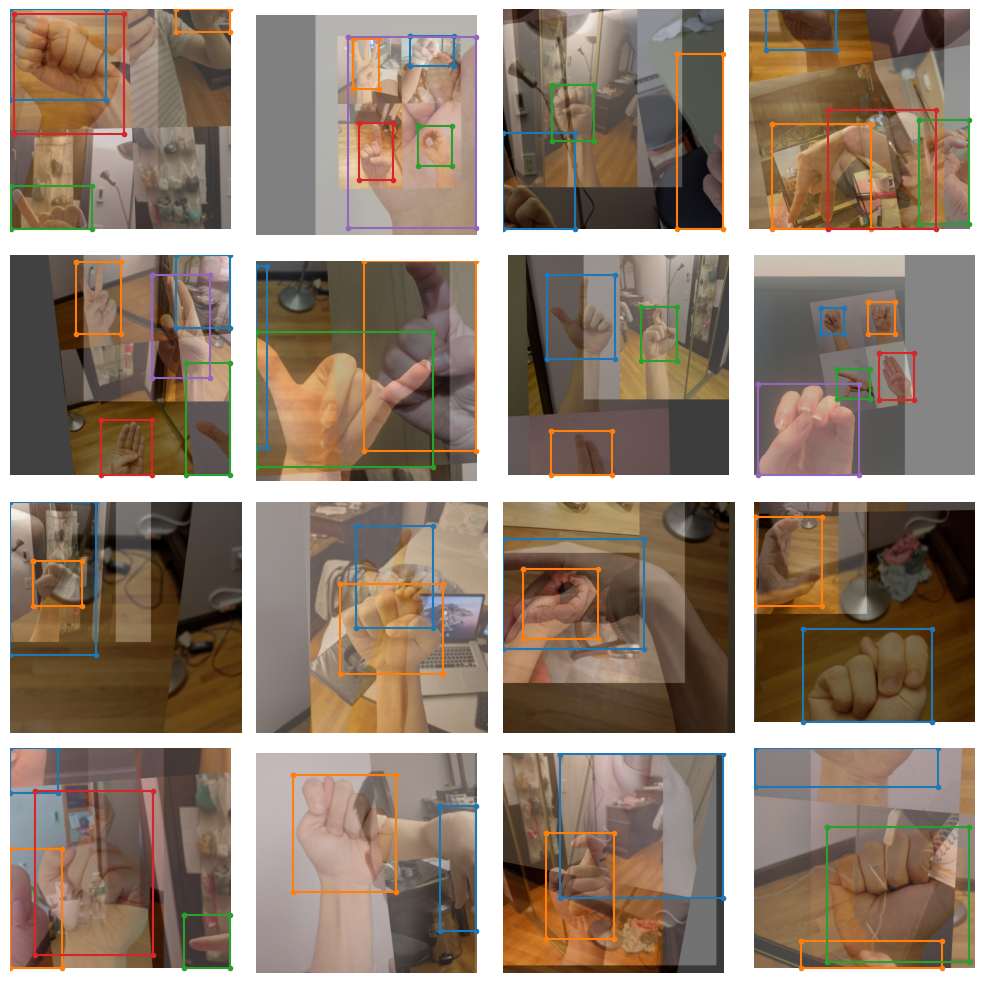

In [11]:
train_data.dataset.plot()

**Step 09: Instantiating the model
YOLO-NAS:**

Below is how to instantiate the model for finetuning. Note you need to add the num_classes argument here.

SuperGradients has three flavors for YOLONAS: yolo_nas_s, yolo_nas_m and yolo_nas_l.

- yolo_nas_s is the fastest around all others but is less accurate
- yolo_nas_m is medium
- yolo_nas_l is the most accurate but slowest


In [12]:
model = models.get('yolo_nas_l',
                   num_classes=len(dataset_params['classes']),
                   pretrained_weights="coco"
                   )


[2023-11-20 22:02:32] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_l_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_l_coco.pth
100%|██████████| 256M/256M [00:03<00:00, 84.9MB/s]
[2023-11-20 22:02:36] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l


**Step 10: Define metrics and training parameters**
We need to define the training parameters for your training run.

Full details about the training parameters can be found here.

There are a few mandatory arguments that we must define for training params

max_epochs - Max number of training epochs

loss - the loss function you want to use

optimizer - Optimizer you will be using

train_metrics_list - Metrics to log during training

valid_metrics_list - Metrics to log during training

metric_to_watch - metric which the model checkpoint will be saved according to

We can choose from a variety of optimizer's such as: Adam, AdamW, SGD, Lion, or RMSProps. If you choose to change the defualt parameters of these optimizrs you pass them into optimizer_params.

In [13]:
train_params = {
    # ENABLING SILENT MODE
    'silent_mode': True,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    # ONLY TRAINING FOR 10 EPOCHS FOR THIS EXAMPLE NOTEBOOK
    "max_epochs": 50,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.8
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

**Step 11: Training the model**

You've covered a lot of ground so far:

Instantiated the trainer

Defined your dataset parameters and dataloaders

Instantiated a model

Set up your training parameters

In [14]:

trainer.train(model=model,
              training_params=train_params,
              train_loader=train_data,
              valid_loader=val_data)


[2023-11-20 22:02:44] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20231120_220244_704896`
[2023-11-20 22:02:44] INFO - sg_trainer.py - Checkpoints directory: checkpoints2/sign_yolonas_run2/RUN_20231120_220244_704896
[2023-11-20 22:02:44] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.


The console stream is now moved to checkpoints2/sign_yolonas_run2/RUN_20231120_220244_704896/console_Nov20_22_02_44.txt


[2023-11-20 22:02:44] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
[2023-11-20 22:02:51] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            504        (len(train_set))
    - Batch size per GPU:           16         (batch_siz

**Step 12: Get the best trained model**

In [16]:
#Print the best model using yolo_nas_small which is faster but less accurate
best_model = models.get('yolo_nas_l',
                        num_classes=len(dataset_params['classes']),
                        checkpoint_path="/content/checkpoints2/sign_yolonas_run2/RUN_20231120_220244_704896/ckpt_best.pth")


[2023-11-20 23:06:34] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/checkpoints2/sign_yolonas_run2/RUN_20231120_220244_704896/ckpt_best.pth EMA checkpoint.


**Step 13: Evaluating the best trained model on the test set**

In [17]:
#Train the model to see the mean average position with dataset
trainer.test(model=best_model,
            test_loader=test_data,
            test_metrics_list=DetectionMetrics_050(score_thres=0.1,
                                                   top_k_predictions=300,
                                                   num_cls=len(dataset_params['classes']),
                                                   normalize_targets=True,
                                                   post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01,
                                                                                                          nms_top_k=1000,
                                                                                                          max_predictions=300,
                                                                                                          nms_threshold=0.7)
                                                  ))


Testing:  80%|████████  | 4/5 [00:03<00:00,  1.17it/s]

{'PPYoloELoss/loss_cls': 0.70150024,
 'PPYoloELoss/loss_iou': 0.16563992,
 'PPYoloELoss/loss_dfl': 0.40035793,
 'PPYoloELoss/loss': 1.2674983,
 'Precision@0.50': 0.1807672530412674,
 'Recall@0.50': 0.9791666865348816,
 'mAP@0.50': 0.9338147044181824,
 'F1@0.50': 0.29357272386550903}

Testing: 100%|██████████| 5/5 [00:04<00:00,  1.14it/s]


**Step 15: Predicting with the best model**

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
[2023-11-20 23:06:54] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.


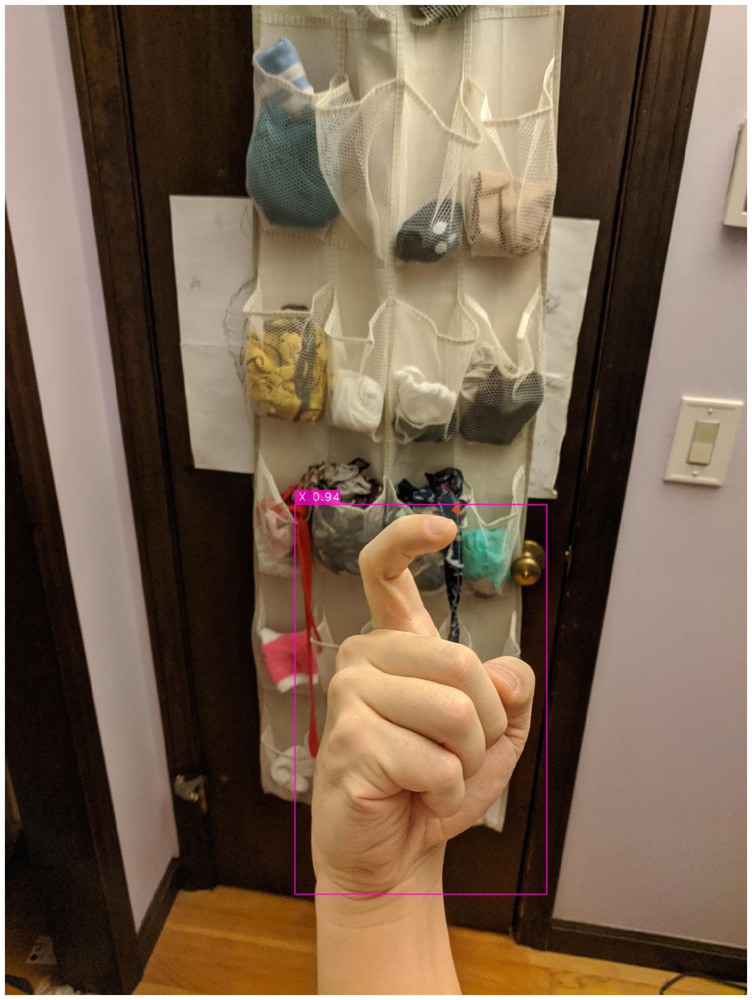

In [18]:
img_url = '/content/American-Sign-Language-Letters-6/test/images/X14_jpg.rf.1f2b3444f6a542e5e9a3ba6de1a983b2.jpg'
best_model.predict(img_url).show()

**Step 16: Testing on Video 1**

In [19]:
input_video_path = f"/content/ASL_Test_1.mp4"
output_video_path = "detections.mp4"

In [20]:
import torch
device = 'cuda' if torch.cuda.is_available() else "cpu"

In [21]:

best_model.to(device).predict(input_video_path).save(output_video_path)

Predicting Video: 100%|██████████| 802/802 [00:19<00:00, 40.83it/s]


**Display the Output Video**

In [22]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!rm '/content/ASL_Test_1_Results.mp4'

In [23]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/detections.mp4'

# Compressed video path
compressed_path = "/content/ASL_Test_1_Results.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video controls>
    <source src="%s" type="video/mp4">
</video>
""" % data_url)

rm: cannot remove '/content/ASL_Test_1_Results.mp4': No such file or directory


**Step 17: Testing on Video 2**

In [24]:
input_video_path = f"/content/ASL_Test_2.mp4"
output_video_path = "detections2.mp4"

In [25]:
import torch
device = 'cuda' if torch.cuda.is_available() else "cpu"

In [26]:
best_model.to(device).predict(input_video_path).save(output_video_path)

Predicting Video: 100%|██████████| 1542/1542 [00:57<00:00, 26.92it/s]


**Display the Output Video**

In [27]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!rm '/content/ASL_Test_2_Results.mp4'

In [28]:

from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/detections2.mp4'

# Compressed video path
compressed_path = "/content/ASL_Test_2_Results.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video controls>
    <source src="%s" type="video/mp4">
</video>
""" % data_url)


rm: cannot remove '/content/ASL_Test_2_Results.mp4': No such file or directory
